In [1]:
from IPython.display import display, Audio

from asteroid.models import BaseModel
import soundfile as sf
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display


In [2]:
model = BaseModel.from_pretrained("popcornell/FasNetTAC-paper")


In [7]:
fan_raw, sr = sf.read("/home/kjc/mimii/0dB/fan/id_00/normal/00000000.wav", dtype="float32")
fan = fan_raw.transpose().reshape(1, 8, 160000)

slider_raw, _ = sf.read("/home/kjc/mimii/0dB/slider/id_00/normal/00000000.wav", dtype="float32")
slider = slider_raw.transpose().reshape(1, 8, 160000)

pump_raw, _ = sf.read("/home/kjc/mimii/0dB/pump/id_00/normal/00000000.wav", dtype="float32")
pump = pump_raw.transpose().reshape(1, 8, 160000)

valve_raw, _ = sf.read("/home/kjc/mimii/0dB/valve/id_00/normal/00000000.wav", dtype="float32")
valve = valve_raw.transpose().reshape(1, 8, 160000)

mixture = valve[:, :, :] + pump[:, :, :]


In [8]:
out_wavs = model.separate(mixture)

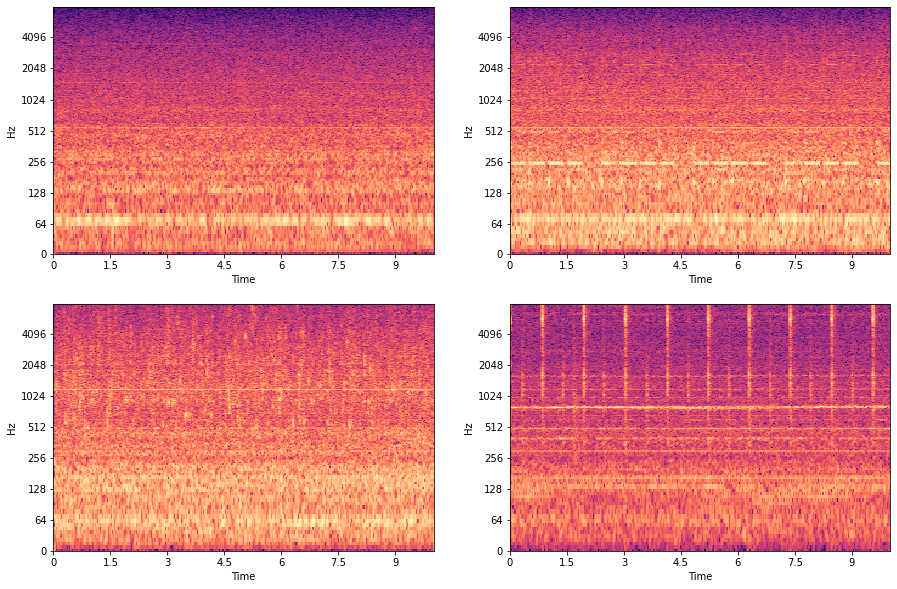

In [5]:
def show_magspec(waveform, **kw):
    return librosa.display.specshow(
        librosa.amplitude_to_db(np.abs(librosa.stft(waveform))),
        y_axis="log", x_axis="time",
        **kw
    )


fig, ax = plt.subplots(2, 2, figsize=(15, 10))
show_magspec(fan[0, 0, :], sr=16000, ax=ax[0][0])
show_magspec(slider[0, 0, :], sr=16000, ax=ax[0][1])
show_magspec(pump[0, 0, :], sr=16000, ax=ax[1][0])
show_magspec(valve[0, 0, :], sr=16000, ax=ax[1][1])

display(Audio(fan[0, :, :], rate=16000))
display(Audio(slider[0, :, :], rate=16000))
display(Audio(pump[0, :, :], rate=16000))
display(Audio(valve[0, :, :], rate=16000))

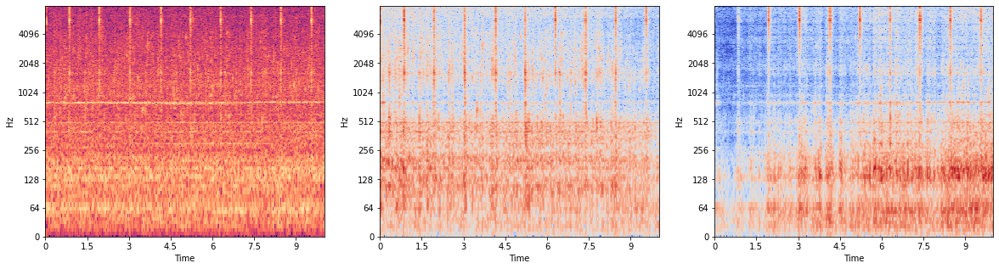

In [9]:
fig, ax = plt.subplots(1, 3, figsize=(20, 5))
show_magspec(mixture[0, 0, :], sr=16000, ax=ax[0])
show_magspec(out_wavs[0, 0, :], sr=16000, ax=ax[1])
show_magspec(out_wavs[0, 1, :], sr=16000, ax=ax[2])

display(Audio(mixture[0, :, :], rate=16000))
display(Audio(out_wavs[0, 0, :], rate=16000))
display(Audio(out_wavs[0, 1, :], rate=16000))